# Stent segmentation — starting point

**Goal.** Segment the stent surface point cloud into small, meaningful
**pipe-like pieces** *before* skeletonisation, so that getting the skeleton
becomes easier (especially for stents where a clean skeleton is hard to obtain
without first regionising). The pieces do not have to be crowns/bridges — any
locally tube-like segment is useful.

This notebook collects what we already have (`preprocess_stent` +
`segment_stent` from `stent_funcs.py`) as a clean baseline. `segment_stent` is
copied in below so we can iterate on it directly. We will improve it from here.

In [32]:
import os, sys
import numpy as np
import pandas as pd
import trimesh
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
from scipy.signal import find_peaks
from scipy.ndimage import uniform_filter1d

sys.path.insert(0, os.path.abspath('..'))
from functions.stent_funcs import compute_pre_stent_size_ratio, preprocess_stent

STL_ROOT = os.path.join(os.path.abspath('../..'), 'input_examples', 'stent_designs')

STENT_NAME      = 'stent1'        # change manually to try other stents

STENT_NAME = '2crownCrimpedXienceStent'
STENT_NAME = '16crownCrimpedXienceStent+extremaSupports'  

STENT_STL_FILE  = os.path.join(STL_ROOT, f'{STENT_NAME}.stl')

if STENT_NAME == '16crownCrimpedXienceStent+extremaSupports':
    REMOVE_SUPPORTS = True
else:
    REMOVE_SUPPORTS = False

OVERRIDE_N_SAMPLES = None  # set to an integer to override the number of samples (for testing)

## 1 - Load STL & preprocess (point cloud + features)

Uses `preprocess_stent` only: surface sampling, PCA alignment of the stent axis
to z, cylindrical `(r, theta, z)`, and the `strut_thickness` / `r_mid` features.

In [33]:
original_mesh  = trimesh.load(STENT_STL_FILE, force='mesh')
pre_stent_info = compute_pre_stent_size_ratio(original_mesh)
pre_size_ratio = pre_stent_info['size_ratio']
pre_length     = pre_stent_info['length']

# sampling budget (same heuristic as the skeleton pipeline)
target_samples = int(1e6) if (pre_size_ratio < 10 or pre_length < 15) else int(1e7)

samples_per_face   = 1
n_thickness_slices = 100
slice_cutoff       = int(n_thickness_slices * 0.05)

n_faces   = len(original_mesh.faces)
n_samples = n_faces * samples_per_face
if n_samples > 10 * target_samples:
    n_samples = n_samples // 10
elif n_samples < target_samples * 0.5:
    n_samples = n_samples * 10
if OVERRIDE_N_SAMPLES is not None:
    n_samples = OVERRIDE_N_SAMPLES
print(f"Sampling {n_samples:,} points from {n_faces:,} faces.")

preprocess_result = preprocess_stent(
    mesh                = original_mesh,
    n_samples           = n_samples,
    samples_per_face    = samples_per_face,
    n_thickness_slices  = n_thickness_slices,
    slice_cutoff        = slice_cutoff,
    thickness_calc_plot = False,
    remove_supports     = REMOVE_SUPPORTS,
)
stent_df       = preprocess_result['stent_df']
stent_features = preprocess_result['stent_features']

print(f"{STENT_NAME}: {len(stent_df):,} surface points")
print(f"length={stent_features['length']:.3f}  radius={stent_features['radius']:.3f}  "
      f"r_mid={stent_features['r_mid']:.4f}  strut={stent_features['strut_thickness']:.4f}")

Sampling 19,549,168 points from 19,549,168 faces.
[3.4] End cutoff: 5,153,139 points dropped (26.4%) for z_cyl ∉ [-8.6221, 9.1548] mm
16crownCrimpedXienceStent+extremaSupports: 14,396,029 surface points
length=17.777  radius=0.639  r_mid=0.5005  strut=0.2058


## 2 - Segmentation (the function we will improve)

This is the current `segment_stent` from `stent_funcs.py`, copied here so we can
iterate on it. It slices the stent along z, links nearby points within each
slice (3-D radius scaled to point density), and labels the connected components
as regions.

**Known weakness:** pure proximity merges distinct struts that pass close at
crown apices and around bends. The improvement target is to instead split the
stent into small, locally pipe-like segments.

In [34]:
def segment_stent(
    stent_df: pd.DataFrame,
    n_long_slices: int,
    segmentation_wanted: bool,
    strut_thickness: float,
    small_logic: str = 'or',          # 'or' = small by count OR by span; 'and' = both
    show_plots: bool = False,
) -> dict:
    """
    Longitudinal-slice connected components + valley-threshold merge of small fragments.

    A fragment is judged "small" using TWO measures, each with its own
    valley threshold:
        • point count           — number of surface points in the region
        • bbox diagonal (mm)     — 3-D bounding-box diagonal of the region
                                   (orientation-agnostic physical span; chosen
                                   over a z-only span, which is biased toward
                                   circumferential struts and capped by slicing)
    `small_logic` decides how to combine them ('or' catches more, 'and' is
    conservative).

    Returns the same keys as before:
        stent_df       — with merged, compactly renumbered 'region' column
        region_allowed — (R+1 x R+1) bool adjacency matrix for merged regions
        n_regions      — number of regions after merge
        conn_radius_3d — the derived connection radius
    """
    if not segmentation_wanted:
        stent_df['region'] = 1
        region_allowed     = np.array([[True]])
        whole_stent_region = np.array([[True]])
        print("[6.1.5] Segmentation skipped — all points in one region")
        return {
            'stent_df'      : stent_df,
            'region_allowed': region_allowed,
            'whole_stent_region': whole_stent_region, 
            'n_regions'     : 1,
            'conn_radius_3d': 0.0,
        }
    

    whole_stent_region = np.array([[True]])  # all points belong to the same whole-stent region

    pts3d     = stent_df[['x', 'y', 'z']].values
    z_vals    = stent_df['z_cylindrical'].values
    n_samples = len(pts3d)

    # conn_radius_3d: min of density-based and strut-based estimates
    r_mean         = stent_df['r'].values.mean()
    z_range        = z_vals.max() - z_vals.min()
    surface_area   = 2 * np.pi * r_mean * z_range
    avg_spacing    = np.sqrt(surface_area / n_samples)
    conn_radius_3d = min(3.0 * avg_spacing, strut_thickness)
    print(f"[6.1.5] conn_radius_3d={conn_radius_3d:.4f}  (density-based={3*avg_spacing:.4f}, strut-based={strut_thickness:.4f})")

    # ── Initial segmentation: slice + connected components ────────────────────
    z_edges = np.linspace(z_vals.min(), z_vals.max(), n_long_slices + 1)
    slc     = np.clip(np.digitize(z_vals, z_edges) - 1, 0, n_long_slices - 1)

    tree  = cKDTree(pts3d)
    all_p = tree.query_pairs(r=conn_radius_3d, output_type='ndarray')

    same  = slc[all_p[:, 0]] == slc[all_p[:, 1]]
    pairs = all_p[same]
    cross = all_p[~same]          # kept for region_allowed — no second query_pairs needed

    adj = csr_matrix(
        (np.ones(2 * len(pairs), np.uint8),
         (np.concatenate([pairs[:, 0], pairs[:, 1]]),
          np.concatenate([pairs[:, 1], pairs[:, 0]]))),
        shape=(n_samples, n_samples))
    _, region = connected_components(adj, directed=False)

    # ── Valley-threshold helper ───────────────────────────────────────────────
    def _valley_thresholds(sizes, near_zero_frac=0.4, n_bins=50):
        s           = sizes[sizes > 0]
        hist, edges = np.histogram(s, bins=n_bins)
        smooth      = uniform_filter1d(hist.astype(float), size=3)
        centers     = 0.5 * (edges[:-1] + edges[1:])
        peak_idx    = int(np.argmax(smooth))
        near_zero   = near_zero_frac * smooth[peak_idx]
        mode        = float(centers[peak_idx])
        small_thresh = None
        for i in range(peak_idx - 1, -1, -1):
            if smooth[i] <= near_zero:
                small_thresh = float(centers[i]); break
        large_thresh = None
        for i in range(peak_idx + 1, len(smooth)):
            if smooth[i] <= near_zero:
                large_thresh = float(centers[i]); break
        return mode, small_thresh, large_thresh, smooth, centers, edges

    # ── Per-region size measures: point count + 3-D bounding-box diagonal ─────
    ids, counts = np.unique(region, return_counts=True)

    geom = pd.DataFrame({'region': region,
                         'x': pts3d[:, 0], 'y': pts3d[:, 1], 'z': pts3d[:, 2]})
    agg  = geom.groupby('region').agg(['min', 'max'])
    span = np.sqrt(sum((agg[(c, 'max')] - agg[(c, 'min')]) ** 2 for c in ('x', 'y', 'z')))
    diag = span.loc[ids].to_numpy()              # bbox diagonal aligned to `ids`

    mode_c, small_c, large_c, sm_c, ct_c, ed_c = _valley_thresholds(counts)
    mode_d, small_d, large_d, sm_d, ct_d, ed_d = _valley_thresholds(diag)

    if show_plots:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 3.4))
        for ax, centers, smooth, edges, mode, small_t, xlabel, fmt in (
            (ax1, ct_c, sm_c, ed_c, mode_c, small_c, 'region point-count',        '.0f'),
            (ax2, ct_d, sm_d, ed_d, mode_d, small_d, 'region bbox diagonal (mm)', '.3g'),
        ):
            ax.bar(centers, smooth, width=np.diff(edges) * 0.85, color='steelblue', align='center')
            ax.axvline(mode, color='orange', ls='--', lw=2, label=f'mode={mode:{fmt}}')
            if small_t is not None:
                ax.axvline(small_t, color='red', ls='--', lw=2, label=f'small<{small_t:{fmt}}')
            ax.set_xlabel(xlabel); ax.set_ylabel('# regions'); ax.legend()
        fig.suptitle('region-size distributions — valley thresholds')
        plt.tight_layout(); plt.show()

    # ── Combine the two "small" criteria ──────────────────────────────────────
    small_by_count = counts < small_c if small_c is not None else np.zeros(len(ids), bool)
    small_by_diag  = diag   < small_d if small_d is not None else np.zeros(len(ids), bool)
    small_mask     = (small_by_count & small_by_diag) if small_logic == 'and' \
                     else (small_by_count | small_by_diag)

    n_raw   = len(ids)
    ct_txt  = f"{small_c:.0f}" if small_c is not None else "—"
    dg_txt  = f"{small_d:.3g}" if small_d is not None else "—"
    small_ids  = ids[small_mask]
    normal_ids = ids[~small_mask]

    if len(small_ids) and len(normal_ids):
        print(f"[6.1.5] {n_raw} raw regions | small if count<{ct_txt} {small_logic.upper()} "
              f"diag<{dg_txt} mm | merging {len(small_ids)} "
              f"(count-only={small_by_count.sum()}, diag-only={small_by_diag.sum()})")

        s_idx = np.where(np.isin(region, small_ids))[0]
        n_idx = np.where(~np.isin(region, small_ids))[0]

        # Group touching small fragments into connected groups
        k        = len(small_ids)
        sid_to_i = {sid: i for i, sid in enumerate(small_ids)}
        s_node   = np.array([sid_to_i[region[i]] for i in s_idx])

        sp = cKDTree(pts3d[s_idx]).query_pairs(r=conn_radius_3d, output_type='ndarray')
        if len(sp):
            a, b = s_node[sp[:, 0]], s_node[sp[:, 1]]
            m    = a != b
            g    = csr_matrix((np.ones(m.sum()), (a[m], b[m])), shape=(k, k))
            g    = g + g.T
        else:
            g = csr_matrix((k, k))
        _, grp_label = connected_components(g, directed=False)
        s_grp = grp_label[s_node]

        # Absorb each group into the nearest normal/large region
        n_tree       = cKDTree(pts3d[n_idx])
        n_reg        = region[n_idx]
        s_dist, s_nn = n_tree.query(pts3d[s_idx])
        s_nreg       = n_reg[s_nn]

        pick   = (pd.DataFrame({'grp': s_grp, 'dist': s_dist, 'nreg': s_nreg})
                    .groupby('grp')['dist'].idxmin())
        n_grps        = int(grp_label.max()) + 1
        target        = np.empty(n_grps, dtype=region.dtype)
        target[s_grp[pick.to_numpy()]] = s_nreg[pick.to_numpy()]

        region        = region.copy()
        region[s_idx] = target[s_grp]
        print(f"[6.1.5] → {len(np.unique(region))} regions after merge")
    else:
        print(f"[6.1.5] Nothing to merge (count<{ct_txt} {small_logic.upper()} diag<{dg_txt})")

    # ── Compact renumbering ───────────────────────────────────────────────────
    _, inv   = np.unique(region, return_inverse=True)
    region_f = (inv + 1).astype(np.int32)   # 1-based, dense
    R        = int(region_f.max())

    stent_df           = stent_df.copy()
    stent_df['region'] = region_f

    # ── Efficient region_allowed from cross pairs ─────────────────────────────
    # Two different regions are adjacent only across slice boundaries (within a
    # slice, connected components already merged all nearby points into one region).
    # We reuse the cross pairs from the initial query_pairs — no second KDTree
    # query needed.  Remapping through region_f gives adjacency for the merged,
    # renumbered regions automatically.
    region_allowed = np.zeros((R + 1, R + 1), dtype=bool)
    np.fill_diagonal(region_allowed, True)
    if len(cross):
        ra, rb = region_f[cross[:, 0]], region_f[cross[:, 1]]
        diff   = ra != rb
        if diff.any():
            adj_pairs = np.unique(np.sort(np.column_stack([ra[diff], rb[diff]]), axis=1), axis=0)
            region_allowed[adj_pairs[:, 0], adj_pairs[:, 1]] = True
            region_allowed[adj_pairs[:, 1], adj_pairs[:, 0]] = True
    region_allowed[0, :] = True
    region_allowed[:, 0] = True

    return {
        'stent_df'      : stent_df,
        'region_allowed': region_allowed,
        'whole_stent_region': whole_stent_region,
        'n_regions'     : R,
        'conn_radius_3d': conn_radius_3d,
    }

[6.1.5] conn_radius_3d=0.0059  (density-based=0.0059, strut-based=0.2058)


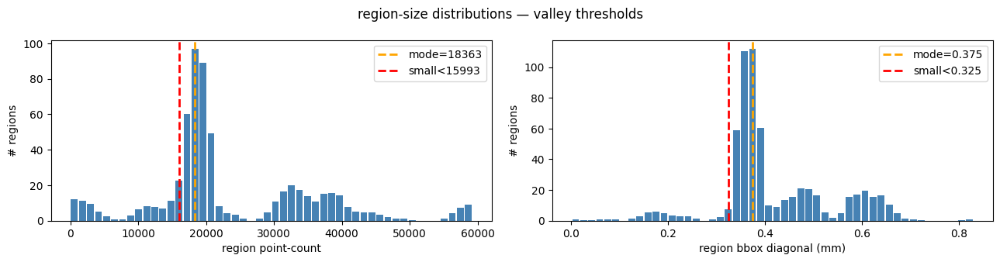

[6.1.5] 613 raw regions | small if count<15993 OR diag<0.325 mm | merging 86 (count-only=86, diag-only=45)
[6.1.5] → 527 regions after merge
n_long_slices=56  n_regions=527  conn_radius_3d=0.0059


In [35]:
n_long_slices = int(2 * np.ceil(stent_features['length'] / stent_features['radius']))

segmented     = segment_stent(
    stent_df            = stent_df,
    n_long_slices       = n_long_slices,
    segmentation_wanted = True,   # set to True to enable the segmentation (long slices + valley-threshold merge)
    strut_thickness     = stent_features['strut_thickness'],
    small_logic         = 'or',     # 'or' = small by point-count OR bbox-diagonal; 'and' = both
    show_plots          = True,
)
stent_df       = segmented['stent_df']
region_allowed = segmented['region_allowed']
n_regions      = segmented['n_regions']
whole_stent_region = segmented['whole_stent_region']
print(f"n_long_slices={n_long_slices}  n_regions={n_regions}  "
      f"conn_radius_3d={segmented['conn_radius_3d']:.4f}")

## 3 - Visualise the segmentation

Regions on the unrolled `(z, arc = r_mid*theta)` plane (random colour per
region) and as a 3-D point cloud.

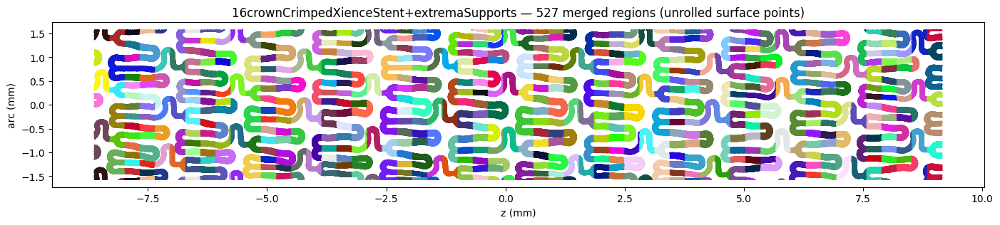

In [36]:
r_mid  = stent_features['r_mid']
arc    = r_mid * stent_df['theta'].to_numpy()
z      = stent_df['z'].to_numpy()
region = stent_df['region'].to_numpy()

# subsample for a responsive scatter
N       = len(stent_df)
max_pts = int(1e6)
sel     = np.random.default_rng(0).choice(N, min(N, max_pts), replace=False)

rng    = np.random.default_rng(1)
cmap   = {r: rng.random(3) for r in np.unique(region)}
colors = np.array([cmap[r] for r in region[sel]])

fig, ax = plt.subplots(figsize=(14, 5))
ax.scatter(z[sel], arc[sel], s=1.0, c=colors, linewidths=0)
ax.set_aspect('equal')
ax.set_xlabel('z (mm)'); ax.set_ylabel('arc (mm)')
ax.set_title(f'{STENT_NAME} — {n_regions} merged regions (unrolled surface points)')
plt.tight_layout(); plt.show()

## 5 — Skeletonisation

Run the same pipeline as `stent_skeleton.ipynb` on the **merged** segmentation.
Choose `METHOD = "voronoi"` (recommended, no manual tuning) or `"raster"` (legacy).

In [37]:
from skimage.morphology import skeletonize, dilation, closing, disk


def compute_skeleton_2d(
    arc_flat: np.ndarray,
    z_flat: np.ndarray,
    arc_min_flat: float,
    arc_max_flat: float,
    circumference: float,
    stent_df: pd.DataFrame,
    stent_geometry: dict,
    pixels_per_strut: int,
    dilate_px: int,
    pad_fraction: float,
    plot: bool,
) -> dict:
    """
    Rasterise → dilate → skeletonise → back to physical (arc, z) coords.

    Unrolling the stent into the (arc, z) plane introduces an artificial seam at
    the arc boundary. To skeletonise continuously across it, the surface points
    are replicated ±circumference and a `pad_fraction` margin of that band is
    kept. The canvas is sized to the *padded* band (so the seam copies are NOT
    clipped onto the boundary columns), then the skeleton is cropped back to the
    real arc window [arc_min_flat, arc_max_flat].
    """
    pixel_size = stent_geometry['strut_thickness'] / pixels_per_strut

    # ── Seam padding: replicate along arc and keep a margin band ──────────────
    arc_three = np.concatenate([arc_flat - circumference, arc_flat, arc_flat + circumference])
    z_three   = np.concatenate([z_flat,                   z_flat,   z_flat])
    band      = ((arc_three >= arc_flat.min() - pad_fraction * circumference) &
                 (arc_three <= arc_flat.max() + pad_fraction * circumference))
    arc_pad, z_pad = arc_three[band], z_three[band]   # padded surface points (incl. seam copies)

    # ── Canvas spans the *padded* band so seam copies are not clipped ─────────
    arc_lo, arc_hi = arc_pad.min(), arc_pad.max()
    z_lo,   z_hi   = z_pad.min(),   z_pad.max()
    n_cols = int(np.ceil((arc_hi - arc_lo) / pixel_size)) + 1
    n_rows = int(np.ceil((z_hi   - z_lo)   / pixel_size)) + 1

    col_idx = np.clip(((arc_pad - arc_lo) / pixel_size).astype(int), 0, n_cols - 1)
    row_idx = np.clip(((z_pad   - z_lo)   / pixel_size).astype(int), 0, n_rows - 1)

    img = np.zeros((n_rows, n_cols), dtype=bool)
    img[row_idx, col_idx] = True

    img_solid = dilation(img,       footprint=disk(dilate_px))
    img_solid = closing (img_solid, footprint=disk(1))

    img_skel = skeletonize(img_solid)

    sk_rows, sk_cols = np.where(img_skel)
    skel_arc_pad = arc_lo + (sk_cols + 0.5) * pixel_size
    skel_z_pad   = z_lo   + (sk_rows + 0.5) * pixel_size

    # ── Crop the padded skeleton back to the real arc window ──────────────────
    seam_mask = (skel_arc_pad >= arc_min_flat) & (skel_arc_pad <= arc_max_flat)
    skel_arc  = skel_arc_pad[seam_mask]
    skel_z    = skel_z_pad[seam_mask]

    if plot:
        fig, axes = plt.subplots(2, 1, figsize=(14, 11))

        axes[0].imshow(img_skel.T, cmap='gray_r', origin='lower',
                       extent=(z_lo, z_hi, arc_lo, arc_hi), aspect='equal')
        axes[0].axhline(arc_min_flat, color='red', linestyle='--', linewidth=1)
        axes[0].axhline(arc_max_flat, color='red', linestyle='--', linewidth=1)
        axes[0].set_title('Skeleton on padded band  (red dashes = kept arc window; outside = padding)')
        axes[0].set_xlabel('z (mm)'); axes[0].set_ylabel('arc (mm)')

        axes[1].scatter(z_pad,      arc_pad,      s=0.3, c='lightsteelblue', linewidths=0)
        axes[1].scatter(skel_z_pad, skel_arc_pad, s=1.0, c='0.65',   linewidths=0, label='padding (dropped)')
        axes[1].scatter(skel_z,     skel_arc,     s=1.5, c='crimson', linewidths=0, label='kept skeleton')
        axes[1].axhline(arc_min_flat, color='red', linestyle='--', linewidth=1)
        axes[1].axhline(arc_max_flat, color='red', linestyle='--', linewidth=1)
        axes[1].set_title('Skeleton over surface points (incl. padding region)')
        axes[1].set_xlabel('z (mm)'); axes[1].set_ylabel('arc (mm)')
        axes[1].set_aspect('equal'); axes[1].legend(loc='upper right', markerscale=6)

        plt.tight_layout()
        plt.show()

    return {
        'skel_arc'             : skel_arc,
        'skel_z'               : skel_z,
        'skel_arc_padded'      : skel_arc_pad,
        'skel_z_padded'        : skel_z_pad,
        'arc_window'           : (arc_min_flat, arc_max_flat),
        'arc_band'             : (arc_lo, arc_hi),
        'pixel_size'           : pixel_size,
        'df_skeleton_2d'       : pd.DataFrame({'arc': skel_arc,     'z': skel_z}),
        'df_skeleton_2d_padded': pd.DataFrame({'arc': skel_arc_pad, 'z': skel_z_pad}),
    }

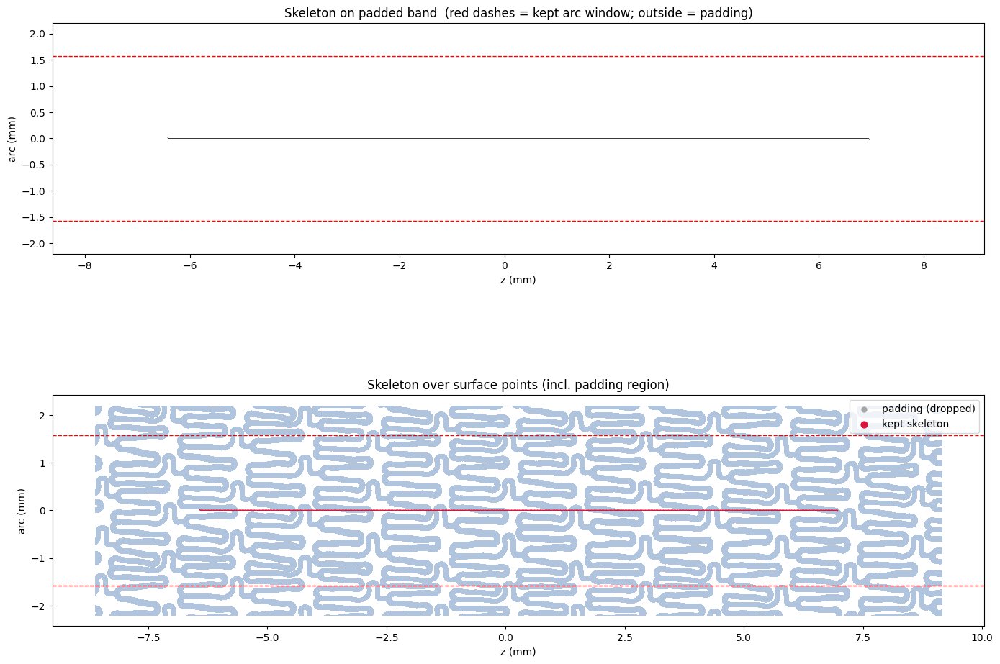

In [38]:
# Example usage
PIXELS_PER_STRUT = 20
DILATE_PX        = 20
PAD_FRACTION     = 0.20

skeleton_2d_result = compute_skeleton_2d(
    arc_flat         = arc,
    z_flat           = z,
    arc_min_flat     = arc.min(),
    arc_max_flat     = arc.max(),
    circumference    = 2 * np.pi * stent_features['r_mid'],
    stent_df         = stent_df,
    stent_geometry   = stent_features,
    pixels_per_strut = PIXELS_PER_STRUT, 
    dilate_px        = DILATE_PX,
    pad_fraction     = PAD_FRACTION,
    plot             = True,
)


## 6 — Skeleton quality check (against the segmented regions)

The skeleton is built on the **whole** stent, but the segmentation is still a
useful reference for spotting defects. `check_skeleton_quality` overlays the
region labels onto the skeleton points and **reports** (does not fix) three
possible problems:

1. **Bad connections** — skeleton edges that join two regions which do not
   actually touch (`region_allowed[a, b]` is `False`).
2. **Region loops** — a region whose skeleton sub-graph contains a cycle.
3. **Empty regions** — a region that received no skeleton point at all.

This runs *after* skeletonisation, since a whole-stent skeleton can occasionally
produce a worse result.

In [39]:
from collections import deque


def _two_core_mask(V: int, a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """Boolean mask of nodes that survive iterative removal of degree<2 nodes
    (the 2-core) — i.e. the loop structure of the sub-graph."""
    deg = np.zeros(V, dtype=int)
    np.add.at(deg, a, 1)
    np.add.at(deg, b, 1)
    adj = [[] for _ in range(V)]
    for u, v in zip(a.tolist(), b.tolist()):
        adj[u].append(v)
        adj[v].append(u)
    alive = np.ones(V, dtype=bool)
    q = deque(np.where(deg <= 1)[0].tolist())
    while q:
        u = q.popleft()
        if not alive[u]:
            continue
        alive[u] = False
        for w in adj[u]:
            if alive[w]:
                deg[w] -= 1
                if deg[w] == 1:
                    q.append(w)
    return alive


def check_skeleton_quality(
    df_skeleton_2d: pd.DataFrame,
    pixel_size: float,
    stent_df: pd.DataFrame,
    r_mid: float,
    region_allowed: np.ndarray,
    surf_tree: cKDTree = None,
    surf_reg: np.ndarray = None,
    verbose: bool = True,
) -> dict:
    """
    Quality report for a whole-stent skeleton, using the segmented regions only
    as a reference (the skeleton itself is computed without segmentation).

    Reports three issues — it does NOT modify the skeleton:
      1. bad_connections : skeleton edges that join two regions which do not
                           actually touch (region_allowed is False).
      2. region_loops    : regions whose skeleton sub-graph contains a cycle.
      3. empty_regions   : regions that received no skeleton point at all.

    Also returns the (arc, z) locations of the offending features so they can
    be drawn on top of the skeleton.

    `surf_tree` / `surf_reg` let a caller pass a prebuilt (arc, z) KD-tree and
    its region labels so a tuner doesn't rebuild it every iteration; when not
    given they are built from `stent_df`.
    """
    skel = df_skeleton_2d[['arc', 'z']].to_numpy()
    n_sk = len(skel)
    n_regions = int(stent_df['region'].max())
    all_regions = np.arange(1, n_regions + 1)

    # ── Assign each skeleton point to the nearest surface point's region ──────
    if surf_tree is None or surf_reg is None:
        surf_arc  = r_mid * stent_df['theta'].to_numpy()
        surf_z    = stent_df['z'].to_numpy()
        surf_reg  = stent_df['region'].to_numpy()
        surf_tree = cKDTree(np.column_stack([surf_arc, surf_z]))
    _, nn       = surf_tree.query(skel)
    skel_region = surf_reg[nn]

    # ── Recover integer pixel-grid coords (skeleton sits on a regular grid) ───
    gi = np.round((skel[:, 0] - skel[:, 0].min()) / pixel_size).astype(int)  # col (arc)
    gj = np.round((skel[:, 1] - skel[:, 1].min()) / pixel_size).astype(int)  # row (z)
    coord_set = set(zip(gi.tolist(), gj.tolist()))
    coord_idx = {(int(gi[k]), int(gj[k])): k for k in range(n_sk)}

    # ── Build the skeleton graph (8-neighbour, diagonal de-duplicated) ────────
    # Each undirected edge is emitted once. A diagonal is dropped when a
    # 4-connected corner exists, so staircase pixels don't create spurious
    # triangle-loops.
    edges = []
    for k in range(n_sk):
        ci, cj = int(gi[k]), int(gj[k])
        for di, dj in ((1, 0), (0, 1)):
            nb = coord_idx.get((ci + di, cj + dj))
            if nb is not None:
                edges.append((k, nb))
        for di, dj in ((1, 1), (1, -1)):
            nb = coord_idx.get((ci + di, cj + dj))
            if nb is not None:
                corner = ((ci + di, cj) in coord_set) or ((ci, cj + dj) in coord_set)
                if not corner:
                    edges.append((k, nb))
    edges = np.array(edges, dtype=int) if edges else np.empty((0, 2), dtype=int)

    # ── 1) Connections between non-touching regions ──────────────────────────
    bad_connections = []
    bad_edge_xy     = np.empty((0, 2))
    if len(edges):
        ra, rb = skel_region[edges[:, 0]], skel_region[edges[:, 1]]
        diff   = ra != rb
        bad    = diff & ~region_allowed[ra, rb]
        if bad.any():
            pairs = np.unique(np.sort(np.column_stack([ra[bad], rb[bad]]), axis=1), axis=0)
            bad_connections = [tuple(int(x) for x in p) for p in pairs]
            bad_edge_xy = 0.5 * (skel[edges[bad, 0]] + skel[edges[bad, 1]])   # (arc, z) midpoints

    # ── 2) Loops within a region (cycles in the per-region sub-graph) ─────────
    region_loops   = {}
    loop_points    = []
    for reg in np.unique(skel_region):
        node_mask = skel_region == reg
        node_idx  = np.where(node_mask)[0]
        V = len(node_idx)
        if len(edges):
            e_mask = node_mask[edges[:, 0]] & node_mask[edges[:, 1]]
            sub    = edges[e_mask]
        else:
            sub = edges
        E = len(sub)
        if E:
            remap = {int(g): i for i, g in enumerate(node_idx)}
            a = np.fromiter((remap[int(x)] for x in sub[:, 0]), dtype=int, count=E)
            b = np.fromiter((remap[int(x)] for x in sub[:, 1]), dtype=int, count=E)
            g = csr_matrix((np.ones(E), (a, b)), shape=(V, V))
            g = g + g.T
            ncomp, _ = connected_components(g, directed=False)
        else:
            ncomp = V
        n_cycles = E - V + ncomp          # independent loops (Betti-1) of the sub-graph
        if n_cycles > 0:
            region_loops[int(reg)] = int(n_cycles)
            core = _two_core_mask(V, a, b)        # the actual loop structure
            loop_points.append(skel[node_idx[core]])
    loop_points_xy = np.vstack(loop_points) if loop_points else np.empty((0, 2))

    # ── 3) Empty regions (no skeleton point assigned) ────────────────────────
    present       = np.unique(skel_region)
    empty_regions = [int(r) for r in np.setdiff1d(all_regions, present)]
    empty_xy      = np.array([[ (r_mid * stent_df.loc[stent_df['region'] == er, 'theta']).mean(),
                                 stent_df.loc[stent_df['region'] == er, 'z'].mean() ]
                              for er in empty_regions]) if empty_regions else np.empty((0, 2))

    result = {
        'n_regions'      : n_regions,
        'n_skel_points'  : n_sk,
        'bad_connections': bad_connections,
        'region_loops'   : region_loops,
        'empty_regions'  : empty_regions,
        'skel_region'    : skel_region,
        'bad_edge_xy'    : bad_edge_xy,      # (K, 2) (arc, z) midpoints of bad edges
        'loop_points_xy' : loop_points_xy,   # (K, 2) (arc, z) loop-structure points
        'empty_xy'       : empty_xy,         # (K, 2) (arc, z) centroids of empty regions
    }

    if verbose:
        print(f"Skeleton quality report — {n_regions} regions, {n_sk:,} skeleton points")
        print("-" * 60)
        if bad_connections:
            print(f"[FAIL] {len(bad_connections)} connection(s) between non-touching regions:")
            for a, b in bad_connections:
                print(f"        region {a} <-> region {b}")
        else:
            print("[ OK ] no connections between non-touching regions")

        if region_loops:
            print(f"[FAIL] {len(region_loops)} region(s) contain a loop:")
            for reg, n in sorted(region_loops.items()):
                print(f"        region {reg}: {n} loop(s)")
        else:
            print("[ OK ] no loops inside any region")

        if empty_regions:
            print(f"[FAIL] {len(empty_regions)} empty region(s) (no skeleton point): {empty_regions}")
        else:
            print("[ OK ] every region has at least one skeleton point")

    return result


quality_report = check_skeleton_quality(
    df_skeleton_2d = skeleton_2d_result['df_skeleton_2d'],
    pixel_size     = skeleton_2d_result['pixel_size'],
    stent_df       = stent_df,
    r_mid          = stent_features['r_mid'],
    region_allowed = region_allowed,
    verbose        = True,
)


Skeleton quality report — 527 regions, 1,302 skeleton points
------------------------------------------------------------
[FAIL] 17 connection(s) between non-touching regions:
        region 2 <-> region 46
        region 14 <-> region 112
        region 14 <-> region 267
        region 28 <-> region 272
        region 28 <-> region 336
        region 38 <-> region 492
        region 51 <-> region 422
        region 57 <-> region 154
        region 76 <-> region 449
        region 102 <-> region 433
        region 132 <-> region 269
        region 167 <-> region 270
        region 174 <-> region 342
        region 181 <-> region 204
        region 185 <-> region 480
        region 240 <-> region 297
        region 312 <-> region 351
[ OK ] no loops inside any region
[FAIL] 479 empty region(s) (no skeleton point): [1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 27, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 45, 47, 48, 49, 52, 53, 54, 55

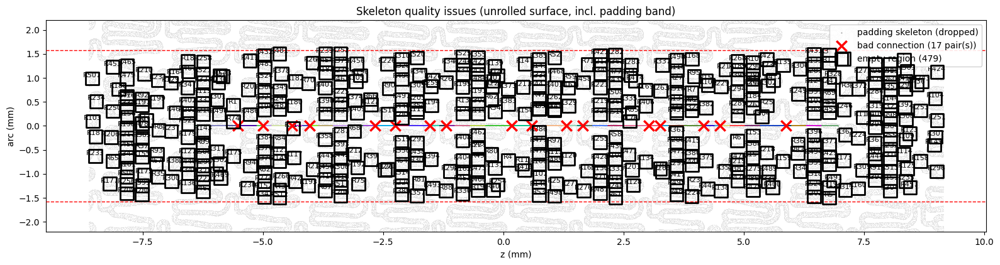

In [40]:
def plot_skeleton_quality(
    skeleton_2d_result: dict,
    stent_df: pd.DataFrame,
    r_mid: float,
    quality_report: dict,
    figsize=(16, 7),
) -> None:
    """Overlay the quality issues on the unrolled (z, arc) skeleton, including
    the seam padding band: skeleton coloured by region inside the kept window,
    the dropped padding skeleton in grey, and bad connections / loops / empty
    regions highlighted. Red dashes mark the kept arc window."""
    skel        = skeleton_2d_result['df_skeleton_2d'][['arc', 'z']].to_numpy()
    skel_pad    = skeleton_2d_result['df_skeleton_2d_padded'][['arc', 'z']].to_numpy()
    skel_region = quality_report['skel_region']
    arc_lo, arc_hi   = skeleton_2d_result['arc_band']
    arc_min, arc_max = skeleton_2d_result['arc_window']
    circ = 2 * np.pi * r_mid

    # ── Replicate surface points across the seam to fill the padded band ──────
    surf_arc = r_mid * stent_df['theta'].to_numpy()
    surf_z   = stent_df['z'].to_numpy()
    a3 = np.concatenate([surf_arc - circ, surf_arc, surf_arc + circ])
    z3 = np.concatenate([surf_z,          surf_z,   surf_z])
    in_band = (a3 >= arc_lo) & (a3 <= arc_hi)
    a3, z3  = a3[in_band], z3[in_band]
    sel = np.random.default_rng(0).choice(len(a3), min(len(a3), int(3e5)), replace=False)

    rng    = np.random.default_rng(1)
    cmap   = {r: rng.random(3) for r in np.unique(skel_region)}
    colors = np.array([cmap[r] for r in skel_region])

    # padding-only skeleton points (outside the kept window)
    pad_only = (skel_pad[:, 0] < arc_min) | (skel_pad[:, 0] > arc_max)

    fig, ax = plt.subplots(figsize=figsize)
    ax.scatter(z3[sel], a3[sel], s=0.3, c='0.88', linewidths=0, zorder=0)
    ax.scatter(skel_pad[pad_only, 1], skel_pad[pad_only, 0], s=2.0, c='0.6',
               linewidths=0, zorder=1, label='padding skeleton (dropped)')
    ax.scatter(skel[:, 1], skel[:, 0], s=2.0, c=colors, linewidths=0, zorder=2)

    ax.axhline(arc_min, color='red', linestyle='--', linewidth=1, zorder=3)
    ax.axhline(arc_max, color='red', linestyle='--', linewidth=1, zorder=3)

    bad_xy   = quality_report['bad_edge_xy']
    loop_xy  = quality_report['loop_points_xy']
    empty_xy = quality_report['empty_xy']

    if len(bad_xy):
        ax.scatter(bad_xy[:, 1], bad_xy[:, 0], s=140, marker='x', c='red',
                   linewidths=2.5, zorder=5,
                   label=f'bad connection ({len(quality_report["bad_connections"])} pair(s))')
    if len(loop_xy):
        ax.scatter(loop_xy[:, 1], loop_xy[:, 0], s=40, marker='o',
                   facecolors='none', edgecolors='magenta', linewidths=1.4, zorder=4,
                   label=f'loop ({len(quality_report["region_loops"])} region(s))')
    if len(empty_xy):
        ax.scatter(empty_xy[:, 1], empty_xy[:, 0], s=220, marker='s',
                   facecolors='none', edgecolors='black', linewidths=2.0, zorder=6,
                   label=f'empty region ({len(empty_xy)})')
        for (a, z_c), er in zip(empty_xy, quality_report['empty_regions']):
            ax.annotate(f'R{er}', (z_c, a), color='black', fontsize=8,
                        ha='center', va='bottom')

    ax.set_aspect('equal')
    ax.set_ylim(arc_lo, arc_hi)          # show the full padded band
    ax.set_xlabel('z (mm)'); ax.set_ylabel('arc (mm)')
    ax.set_title('Skeleton quality issues (unrolled surface, incl. padding band)')
    ax.legend(loc='upper right', framealpha=0.9)
    plt.tight_layout()
    plt.show()


plot_skeleton_quality(
    skeleton_2d_result = skeleton_2d_result,
    stent_df           = stent_df,
    r_mid              = stent_features['r_mid'],
    quality_report     = quality_report,
)


## 7 — Auto-tuning `pixels_per_strut` and `dilate_px` (penalty-driven)

Instead of choosing the raster parameters by hand, `tune_skeleton_params` drives
the **two parameters directly** from the quality-check errors. Each step
skeletonises, scores, and nudges them **in proportion to the (region-normalised)
error** — a large error moves a parameter more than a small one:

| error category | meaning | action |
|---|---|---|
| **bad connections** | non-touching regions joined | `pixels_per_strut` ↑ (sharpen), `dilate_px` ↓ (thin) |
| **empty regions** | a region got no skeleton point | `pixels_per_strut` ↑, weighted by that region's size |
| **loops** | holes in an under-filled strut | `dilate_px` ↑ (thicken to close holes); if `dilate_px` is already at its cap, `pixels_per_strut` ↓ instead |

`pixels_per_strut` is continuous; `dilate_px` is an integer disk radius, so it
moves in proportional integer steps. The loop response is deliberately strong
(`s_dil_loop`) so a heavily-looped result climbs `dilate_px` quickly rather than
crawling +1 at a time. Penalty = `w_conn·conn + w_loop·loop + w_empty·empty`. The
search is capped at `pixels_per_strut ≤ 80` and **90 s**; if it hasn't reached
zero penalty it returns the lowest-penalty step. Every step's parameters and
errors are printed, and the penalty / `pps` / `dilate_px` trajectory is plotted.

step     pps dil_px |  conn  loop  empty |  penalty    score |  t(s)
---------------------------------------------------------------------------
   0   10.00      3 |   350     3  63.87 |  416.866 -416.849 |   0.9
   1   29.03      1 |    66     6   0.00 |   72.000  -71.920 |   1.5
   2   32.16      1 |    53     3   0.00 |   56.000  -55.909 |   2.1
   3   34.67      1 |    45     2   0.00 |   47.000  -46.901 |   2.7
   4   36.81      1 |    40     4   0.00 |   44.000  -43.894 |   3.3
   5   38.70      1 |    33     3   0.00 |   36.000  -35.888 |   4.0
   6   40.27      1 |    33     2   0.00 |   35.000  -34.882 |   4.6
   7   41.84      1 |    28     2   0.00 |   30.000  -29.877 |   5.3
   8   43.16      1 |    24     0   0.00 |   24.000  -23.873 |   6.0
   9   44.30      1 |    23     1   0.00 |   24.000  -23.869 |   6.7
  10   45.39      1 |    20     2   0.00 |   22.000  -21.865 |   7.4
  11   46.34      1 |    23     0   0.00 |   23.000  -22.862 |   8.2
  12   47.43      1 |    20

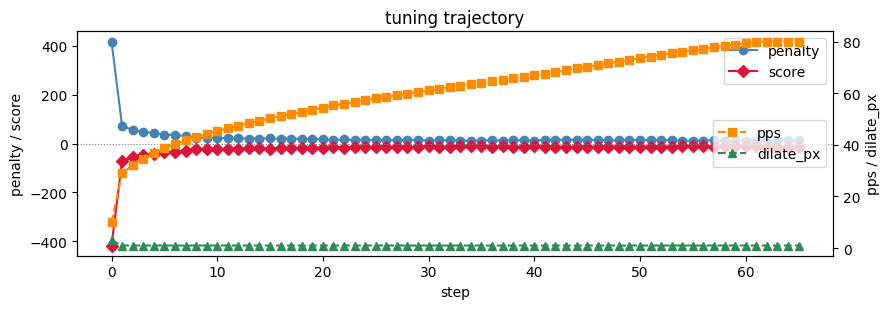

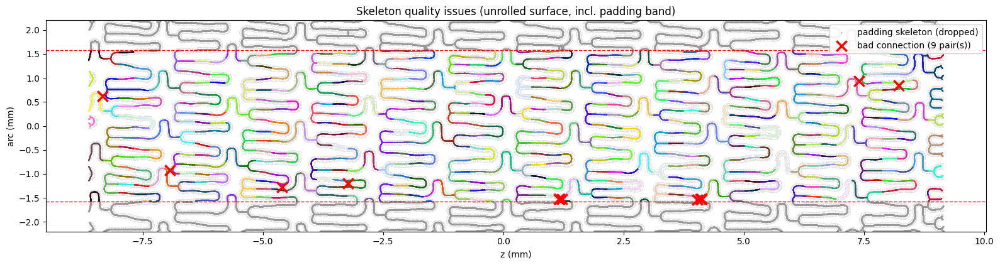

In [41]:
import time
from collections import Counter


def tune_skeleton_params(
    arc: np.ndarray,
    z: np.ndarray,
    stent_df: pd.DataFrame,
    stent_features: dict,
    region_allowed: np.ndarray,
    pps0: float = 10.0,           # starting pixels_per_strut (continuous)
    dil0: int = 3,                # starting dilate_px (integer disk radius)
    pps_min: float = 5.0,
    pps_max: float = 80.0,        # hard cap requested (keeps runtime bounded)
    dil_min: int = 1,
    dil_max: int = 30,            # cap on disk radius -> bounds per-step cost
    s_pps_conn: float = 25.0,     # pps push from bad connections
    s_pps_empty: float = 20.0,    # pps push from empty regions (size-weighted)
    s_pps_loop: float = 15.0,     # pps pull-down for loops when dilate_px is capped
    s_pps_explore: float = 5.0,   # when feasible, step pps up by this to chase a higher score (resolution)
    s_dil_loop: float = 20.0,     # dilate_px push from loops (thicken to fill holes)
    s_dil_conn: float = 8.0,      # dilate_px pull-down from connections (thin)
    w_conn: float = 1.0,
    w_loop: float = 1.0,
    w_empty: float = 1.0,
    w_pps_reward: float = 0.25,   # score reward: prefer higher pps (<1 so it never beats a real error)
    target_penalty: float = 0.0,  # penalty <= this counts as "feasible"
    max_repeats: int = 4,        # stop once the SAME (pps, dil) state has been visited this many times
    pad_fraction: float = 0.20,
    time_limit: float = 90.0,
    max_iters: int = int(1e3),
    verbose: bool = True,
) -> dict:
    """
    Error-driven continuous tuner for `pixels_per_strut` and `dilate_px`.

    Each step skeletonises, scores with `check_skeleton_quality`, and nudges the
    two parameters in proportion to the (region-normalised) errors — a large
    error moves a parameter more than a small one:

        • bad connections (non-touching regions joined)
              -> pixels_per_strut up   (sharpen so regions separate)
              -> dilate_px        down (thin so struts stop bridging)
        • empty regions (no skeleton point)
              -> pixels_per_strut up    (size-weighted by the empty region)
        • loops inside a region (holes in an under-filled strut)
              -> dilate_px        up    (thicken to close the holes)
              -> if dilate_px is already at its cap, pixels_per_strut down
                 instead (coarsen so the existing fill closes the holes)

    `pixels_per_strut` is continuous; `dilate_px` is an integer disk radius so it
    moves in (proportional) integer steps. `dilate_px` is additionally bounded by
    the current `pixels_per_strut` (dil <= pps): a disk radius larger than the
    strut spacing always bridges neighbouring struts, so the effective ceiling is
    min(dil_max, floor(pps)).

    Penalty = w_conn*conn + w_loop*loop + w_empty*empty. The step kept as `best`
    maximises a *score* = reward - penalty, where the reward is a small bonus for
    higher `pixels_per_strut` (so bigger score = better):

        reward = w_pps_reward * (pps - pps_min) / (pps_max - pps_min)   in [0, w_pps_reward]

    Reaching penalty <= `target_penalty` does NOT stop the search — once feasible
    it keeps pushing resolution up (pps += s_pps_explore, with dilate_px scaled by
    the same factor so the *physical* dilation, hence feasibility, is preserved).

    STOPPING is purely cycle-based: the update is deterministic, so if a (pps, dil)
    pair ever recurs the whole trajectory from it repeats. The tuner counts how
    often each (pps, dil) state is visited and stops once any state has been seen
    `max_repeats` times (a true limit cycle, or pinned at a bound). Once the
    skeleton is clean it also stops after 10 clean steps with no score gain
    (converged). It also stops after `time_limit` s / `max_iters`. Returns the
    highest-score step.
    """
    r_mid = stent_features['r_mid']
    circ  = 2 * np.pi * r_mid

    # Prebuild the (arc, z) surface tree ONCE (reused every iteration).
    surf_tree = cKDTree(np.column_stack([r_mid * stent_df['theta'].to_numpy(),
                                         stent_df['z'].to_numpy()]))
    surf_reg     = stent_df['region'].to_numpy()
    n_regions    = int(stent_df['region'].max())
    region_sizes = stent_df['region'].value_counts()
    med_size     = float(np.median(region_sizes.to_numpy()))

    def _errors(qr):
        n_conn = len(qr['bad_connections'])
        n_loop = int(sum(qr['region_loops'].values()))
        if qr['empty_regions']:
            e_empty = sum(float(region_sizes.get(er, 0)) for er in qr['empty_regions']) / med_size
        else:
            e_empty = 0.0
        return n_conn, n_loop, e_empty

    pps = float(pps0)
    # dilate_px can never exceed the strut spacing (dil <= pps).
    dil = int(np.clip(round(dil0), dil_min, min(dil_max, int(pps))))
    best, history = None, []
    seen = Counter()              # (round(pps), dil) -> times visited (cycle / pinned detector)
    best_feasible = None          # best score seen with penalty == 0
    no_improve = 0                # consecutive clean steps with no score gain
    t0 = time.time()
    durs = []                     # per-iteration wall times -> predict the next step's cost

    if verbose:
        print(f"{'step':>4} {'pps':>7} {'dil_px':>6} | {'conn':>5} {'loop':>5} {'empty':>6} "
              f"| {'penalty':>8} {'score':>8} | {'t(s)':>5}")
        print("-" * 75)

    for it in range(max_iters):
        elapsed = time.time() - t0
        # Hard stop: already over budget.
        if elapsed > time_limit:
            print(f"[tune] time limit ({time_limit:.0f}s) reached — stopping")
            break
        # Predictive stop: each step is finer (higher pps) and so costlier than
        # the last, and a step can't be interrupted once started. Project the
        # next step from the last step scaled by the observed step-to-step
        # growth, and stop before launching one that won't finish in time.
        if durs:
            growth = durs[-1] / durs[-2] if len(durs) >= 2 and durs[-2] > 0 else 1.0
            proj   = durs[-1] * max(1.0, growth)
            if elapsed + proj > time_limit:
                print(f"[tune] next step projected ~{proj:.0f}s — would exceed the "
                      f"{time_limit:.0f}s budget at t={elapsed:.0f}s — stopping")
                break

        _it_t0 = time.time()
        res = compute_skeleton_2d(
            arc_flat=arc, z_flat=z, arc_min_flat=arc.min(), arc_max_flat=arc.max(),
            circumference=circ, stent_df=stent_df, stent_geometry=stent_features,
            pixels_per_strut=pps, dilate_px=dil, pad_fraction=pad_fraction, plot=False,
        )
        qr = check_skeleton_quality(
            res['df_skeleton_2d'], res['pixel_size'], stent_df, r_mid, region_allowed,
            surf_tree=surf_tree, surf_reg=surf_reg, verbose=False,
        )
        durs.append(time.time() - _it_t0)
        n_conn, n_loop, e_empty = _errors(qr)
        P = w_conn * n_conn + w_loop * n_loop + w_empty * e_empty
        # Reward higher resolution. score is what we MAXIMISE: bigger = better.
        # A clean skeleton (P=0) scores +reward (small, in [0, w_pps_reward]);
        # any error makes P large and drags the score negative.
        reward = w_pps_reward * (pps - pps_min) / max(1e-9, pps_max - pps_min)
        score  = reward - P
        elapsed = time.time() - t0
        history.append(dict(step=it, pps=round(pps, 2), dil_px=dil, conn=n_conn,
                            loop=n_loop, empty=round(e_empty, 2),
                            penalty=round(P, 3), score=round(score, 3), t=round(elapsed, 1)))
        if verbose:
            print(f"{it:>4} {pps:>7.2f} {dil:>6d} | {n_conn:>5d} {n_loop:>5d} "
                  f"{e_empty:>6.2f} | {P:>8.3f} {score:>8.3f} | {elapsed:>5.1f}")

        if best is None or score > best['score'] + 1e-9:
            best = dict(score=score, penalty=P, pps=pps, dil=dil, conn=n_conn, loop=n_loop,
                        empty=e_empty, result=res, quality_report=qr)

        # Convergence stop: once the skeleton is clean (penalty 0), keep going only
        # while the score keeps improving. A clean step that beats the best clean
        # score resets the counter; 10 clean steps with no gain -> stop.
        if P <= target_penalty:
            if best_feasible is None or score > best_feasible + 1e-9:
                best_feasible = score
                no_improve = 0
            else:
                no_improve += 1
                if no_improve >= 10:
                    print(f"[tune] no score gain for {no_improve} clean steps — stopping (converged)")
                    break

        # Cycle / pinned detector: the update is deterministic, so a repeated
        # (pps, dil) state means we are looping. Stop once one is seen max_repeats×.
        key = (round(pps, 2), dil)
        seen[key] += 1
        if seen[key] >= max_repeats:
            print(f"[tune] same parameters (pps={pps:.2f}, dil_px={dil}) seen "
                  f"{max_repeats}× — stopping (cycle / pinned)")
            break

        # ── Parameter update ──────────────────────────────────────────────────
        if P <= target_penalty:
            # Feasible: keep pushing resolution up to raise the score,
            # scaling dilate_px with pps so the physical shape (and feasibility) holds.
            pps_new = pps + s_pps_explore
            dil_new = int(round(dil * pps_new / pps))
        else:
            # Infeasible: error-proportional correction (errors normalised to [0,1]).
            e_conn_n  = min(1.0, n_conn  / max(1, n_regions))
            e_loop_n  = min(1.0, n_loop  / max(1, n_regions))
            e_empty_n = min(1.0, e_empty / max(1, n_regions))
            dil_cap   = min(dil_max, int(pps))            # hard cap AND strut spacing
            pps_new = pps + s_pps_conn * e_conn_n + s_pps_empty * e_empty_n      # sharpen
            # Thicken to close loops, thin to break bad connections.
            dil_new = dil + int(round(s_dil_loop * e_loop_n)) \
                          - int(round(s_dil_conn * e_conn_n))
            if n_loop > 0 and dil >= dil_cap:     # dilation capped but holes remain -> coarsen pps
                pps_new -= s_pps_loop * e_loop_n

        pps = float(np.clip(pps_new, pps_min, pps_max))
        # Re-clamp dil against the (possibly changed) strut spacing: dil <= pps.
        dil = int(np.clip(dil_new, dil_min, min(dil_max, int(pps))))

    hist_df = pd.DataFrame(history)
    print("\n[tune] BEST  pps={:.2f}  dilate_px={}  penalty={:.3f}  score={:.3f}  "
          "(conn={}, loop={}, empty={:.2f})".format(
              best['pps'], best['dil'], best['penalty'], best['score'],
              int(best['conn']), int(best['loop']), best['empty']))

    # penalty trajectory
    fig, ax = plt.subplots(figsize=(9, 3.2))
    ax.plot(hist_df['step'], hist_df['penalty'], '-o', color='steelblue', label='penalty')
    ax.plot(hist_df['step'], hist_df['score'],   '-D', color='crimson',   label='score')
    ax.axhline(0, color='grey', lw=0.8, ls=':')   # score > 0 = clean skeleton
    ax.set_xlabel('step'); ax.set_ylabel('penalty / score'); ax.set_title('tuning trajectory')
    ax2 = ax.twinx()
    ax2.plot(hist_df['step'], hist_df['pps'],    '--s', color='darkorange', label='pps')
    ax2.plot(hist_df['step'], hist_df['dil_px'], '--^', color='seagreen',   label='dilate_px')
    ax2.set_ylabel('pps / dilate_px')
    ax.legend(loc='upper right'); ax2.legend(loc='center right')
    plt.tight_layout(); plt.show()

    return {
        'best_pps'       : best['pps'],
        'best_dilate_px' : best['dil'],
        'best_penalty'   : best['penalty'],
        'history'        : hist_df,
        'skeleton_2d'    : best['result'],
        'quality_report' : best['quality_report'],
    }


tune_result = tune_skeleton_params(
    arc            = arc,
    z              = z,
    stent_df       = stent_df,
    stent_features = stent_features,
    region_allowed = region_allowed,
    time_limit     = 90.0,
)

# Visualise the best skeleton found
plot_skeleton_quality(
    skeleton_2d_result = tune_result['skeleton_2d'],
    stent_df           = stent_df,
    r_mid              = stent_features['r_mid'],
    quality_report     = tune_result['quality_report'],
)

## 7b — Remove residual bad connections

Tuning minimises bad connections but can't always reach zero. Bad edges join two regions that don't actually touch (`region_allowed` is False) — we already know where they are from the quality report. Here we delete the skeleton points sitting on those edges, breaking the spurious bridge before mapping to 3D. Loops / empty regions are left untouched.

In [48]:
def remove_bad_connections(
    df_skeleton_2d: pd.DataFrame,
    pixel_size: float,
    stent_df: pd.DataFrame,
    r_mid: float,
    region_allowed: np.ndarray,
    surf_tree: cKDTree = None,
    surf_reg: np.ndarray = None,
    verbose: bool = True,
) -> dict:
    """
    Delete skeleton points that bridge two regions which do not actually touch
    (`region_allowed` is False), so the bad connection disappears from the
    (arc, z) skeleton. Region labels come from the nearest surface point and are
    fixed, so removing every point incident to a bad edge clears ALL bad edges in
    a single pass (and leaves a >=2 px gap, so the 3D rebuild won't re-bridge).
    Loops and empty regions are NOT touched.
    """
    skel = df_skeleton_2d[['arc', 'z']].to_numpy()
    n_sk = len(skel)

    # nearest-surface region for each skeleton point
    if surf_tree is None or surf_reg is None:
        surf_arc  = r_mid * stent_df['theta'].to_numpy()
        surf_z    = stent_df['z'].to_numpy()
        surf_reg  = stent_df['region'].to_numpy()
        surf_tree = cKDTree(np.column_stack([surf_arc, surf_z]))
    _, nn       = surf_tree.query(skel)
    skel_region = surf_reg[nn]

    # 8-neighbour grid graph (same construction as check_skeleton_quality)
    gi = np.round((skel[:, 0] - skel[:, 0].min()) / pixel_size).astype(int)
    gj = np.round((skel[:, 1] - skel[:, 1].min()) / pixel_size).astype(int)
    coord_set = set(zip(gi.tolist(), gj.tolist()))
    coord_idx = {(int(gi[k]), int(gj[k])): k for k in range(n_sk)}
    edges = []
    for k in range(n_sk):
        ci, cj = int(gi[k]), int(gj[k])
        for di, dj in ((1, 0), (0, 1)):
            nb = coord_idx.get((ci + di, cj + dj))
            if nb is not None:
                edges.append((k, nb))
        for di, dj in ((1, 1), (1, -1)):
            nb = coord_idx.get((ci + di, cj + dj))
            if nb is not None:
                corner = ((ci + di, cj) in coord_set) or ((ci, cj + dj) in coord_set)
                if not corner:
                    edges.append((k, nb))
    edges = np.array(edges, dtype=int) if edges else np.empty((0, 2), dtype=int)

    # flag points on edges between non-touching regions and drop them
    remove = np.zeros(n_sk, dtype=bool)
    n_bad_edges, bad_pairs = 0, []
    if len(edges):
        ra, rb = skel_region[edges[:, 0]], skel_region[edges[:, 1]]
        bad    = (ra != rb) & ~region_allowed[ra, rb]
        n_bad_edges = int(bad.sum())
        if bad.any():
            remove[np.unique(edges[bad].ravel())] = True
            bad_pairs = [tuple(int(x) for x in p) for p in
                         np.unique(np.sort(np.column_stack([ra[bad], rb[bad]]), axis=1), axis=0)]

    df_clean = df_skeleton_2d.loc[~remove].reset_index(drop=True)
    if verbose:
        if n_bad_edges:
            print(f"[clean] removed {int(remove.sum())} point(s) on {n_bad_edges} bad edge(s) "
                  f"across {len(bad_pairs)} region pair(s) {bad_pairs} "
                  f"-> {len(df_clean):,} points remain")
        else:
            print(f"[clean] no bad connections found -> skeleton unchanged "
                  f"({len(df_clean):,} points)")

    return {
        'df_skeleton_2d': df_clean,
        'skel_arc'      : df_clean['arc'].to_numpy(),
        'skel_z'        : df_clean['z'].to_numpy(),
        'pixel_size'    : pixel_size,
        'n_removed'     : int(remove.sum()),
        'n_bad_edges'   : n_bad_edges,
        'removed_xy'    : skel[remove],   # (K, 2) (arc, z) of the cut points
        'bad_pairs'     : bad_pairs,
    }


# Clean the tuned best skeleton before mapping it to 3D.
best2d = tune_result['skeleton_2d']
skeleton_clean = remove_bad_connections(
    df_skeleton_2d = best2d['df_skeleton_2d'],
    pixel_size     = best2d['pixel_size'],
    stent_df       = stent_df,
    r_mid          = stent_features['r_mid'],
    region_allowed = region_allowed,
)

# Verify no region-defined bad connection survives the cut (same metric as the report).
_qr_check = check_skeleton_quality(
    skeleton_clean['df_skeleton_2d'], skeleton_clean['pixel_size'],
    stent_df, stent_features['r_mid'], region_allowed, verbose=False,
)
print(f"[verify] region-bad connections remaining: {len(_qr_check['bad_connections'])}")


[clean] removed 24 point(s) on 12 bad edge(s) across 9 region pair(s) [(15, 443), (43, 266), (148, 498), (188, 234), (228, 464), (273, 372), (291, 419), (300, 381), (418, 517)] -> 93,528 points remain
[verify] region-bad connections remaining: 0


## 8 — Best skeleton in the 3D point cloud

Wrap the tuned 2D `(arc, z)` skeleton back onto the mid-surface cylinder
(`theta = arc / r_mid`) and overlay it on the surface point cloud — the same
3D view as `stent_skeleton.ipynb`.

Skeleton: 93,528 points, 93,979 edges


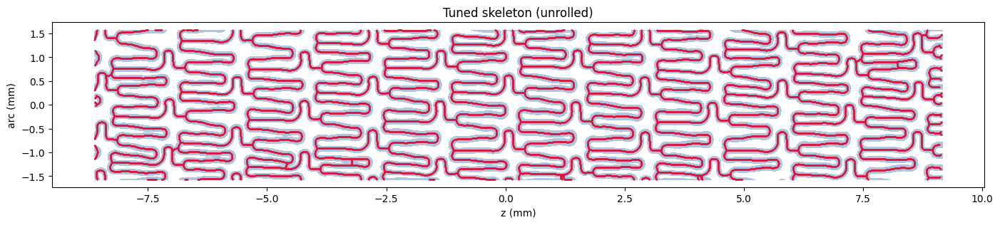

Scene ready — opening viewer...


In [49]:
# ── Best skeleton in the 3D point cloud (as in stent_skeleton.ipynb) ──────────
import ast
from functions.stent_funcs import analyze_skeleton_connectivity

skel_arc   = skeleton_clean['skel_arc']
skel_z     = skeleton_clean['skel_z']
pixel_size = skeleton_clean['pixel_size']
r_mid      = stent_features['r_mid']

# Wrap the unrolled (arc, z) skeleton back onto the mid-surface cylinder.
# theta = arc / r_mid; the result shares the frame of stent_df[['x', 'y', 'z']].
theta_sk = skel_arc / r_mid
df_skeleton_3d = pd.DataFrame({
    'theta': theta_sk,
    'x'    : r_mid * np.cos(theta_sk),
    'y'    : r_mid * np.sin(theta_sk),
    'z'    : skel_z,
})

# Classify nodes and build the neighbour graph (adds node_type / neighbor_ids).
skel_df = analyze_skeleton_connectivity(df_skeleton_3d, pixel_size).reset_index(drop=True)

# Unique edge segments from neighbor_ids (same construction as stent_skeleton.ipynb).
coords        = skel_df.set_index('skeleton_point_id')[['x', 'y', 'z']]
segments, seen = [], set()
for _, row in skel_df.iterrows():
    pid  = row['skeleton_point_id']
    p0   = np.array([row['x'], row['y'], row['z']])
    nbrs = row['neighbor_ids']
    if isinstance(nbrs, str):
        nbrs = ast.literal_eval(nbrs)
    for nid in nbrs:
        key = (min(pid, nid), max(pid, nid))
        if key in seen or nid not in coords.index:
            continue
        seen.add(key)
        segments.append([p0, coords.loc[nid].to_numpy()])
segments = np.array(segments)   # (E, 2, 3)
print(f"Skeleton: {len(skel_df):,} points, {len(segments):,} edges")

# ── 2D view (unrolled arc-z plane): tuned skeleton over surface points ────────
surf_arc = r_mid * stent_df['theta'].to_numpy()
surf_z   = stent_df['z'].to_numpy()
fig, ax = plt.subplots(figsize=(14, 5))
ax.scatter(surf_z, surf_arc, s=0.3, c='lightsteelblue', linewidths=0)
ax.scatter(skel_z, skel_arc, s=1.5, c='crimson',        linewidths=0)
ax.set_aspect('equal')
ax.set_xlabel('z (mm)'); ax.set_ylabel('arc (mm)')
ax.set_title('Tuned skeleton (unrolled)')
plt.tight_layout(); plt.show()

# Surface point cloud (actual stent geometry), subsampled for a responsive viewer.
surf_xyz = stent_df[['x', 'y', 'z']].to_numpy()
max_pts  = int(2e5)
if len(surf_xyz) > max_pts:
    sel      = np.random.default_rng(0).choice(len(surf_xyz), max_pts, replace=False)
    surf_xyz = surf_xyz[sel]

# Skeleton nodes coloured by type (line vs junction), as in stent_skeleton.ipynb.
line_pts     = skel_df[skel_df['node_type'] == 'line'][['x', 'y', 'z']].to_numpy()
junction_pts = skel_df[skel_df['node_type'] == 'junction'][['x', 'y', 'z']].to_numpy()

pc_surface = trimesh.PointCloud(surf_xyz, colors=np.tile([200, 200, 200, 50], (len(surf_xyz), 1)))
scene_geom = [pc_surface]

path = trimesh.load_path(segments)
path.colors = np.tile([100, 160, 220, 200], (len(path.entities), 1))
scene_geom.append(path)

if len(line_pts):
    scene_geom.append(trimesh.PointCloud(line_pts,     colors=np.tile([ 70, 130, 180, 160], (len(line_pts),     1))))
if len(junction_pts):
    scene_geom.append(trimesh.PointCloud(junction_pts, colors=np.tile([255, 140,   0, 255], (len(junction_pts), 1))))

scene = trimesh.Scene(scene_geom)
print("Scene ready — opening viewer...")
scene.show()
